In [1]:
!pip install kaggle

In [2]:
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

cp: cannot stat 'kaggle.json': No such file or directory
chmod: cannot access '/root/.kaggle/kaggle.json': No such file or directory


In [3]:
!kaggle datasets download -d omkargurav/face-mask-dataset

Dataset URL: https://www.kaggle.com/datasets/omkargurav/face-mask-dataset
License(s): unknown
 97% 158M/163M [00:02<00:00, 91.4MB/s]
100% 163M/163M [00:02<00:00, 80.8MB/s]


In [4]:
from zipfile import ZipFile
dataset = '/content/face-mask-dataset.zip'

with ZipFile(dataset,'r') as zip:
  zip.extractall()
  print('Done,data is extraxted')

Done,data is extraxted


In [ ]:
!ls

data  face-mask-dataset.zip  kaggle.json  sample_data


Importing the dependencies

In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import cv2
from google.colab.patches import cv2_imshow
from PIL import Image
from sklearn.model_selection import train_test_split

In [ ]:
with_mask_dir = os.listdir('/content/data/with_mask')
without_mask_dir = os.listdir('/content/data/without_mask')

In [ ]:
print("With Masks:",len(with_mask_dir),"Without Masks:",len(without_mask_dir))


With Masks: 3725 Without Masks: 3828


In [ ]:
#creating labels

#with mask - 1
#without mask - 0

with_mask_lables = [1]*3725
without_mask_lables = [0]*3828

print(with_mask_lables[0:5],without_mask_lables[0:5])

[1, 1, 1, 1, 1] [0, 0, 0, 0, 0]


In [ ]:
#combining the two lists

labels = with_mask_lables + without_mask_lables
print(len(labels))
print(labels[0:5],labels[-5:])


7553
[1, 1, 1, 1, 1] [0, 0, 0, 0, 0]


Displaying Images


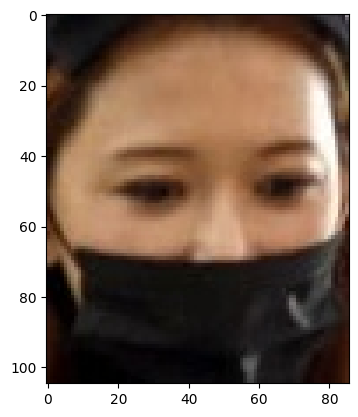

In [ ]:
# with mask image
img = mpimg.imread('/content/data/with_mask/with_mask_100.jpg')
imgplot = plt.imshow(img)
plt.show()

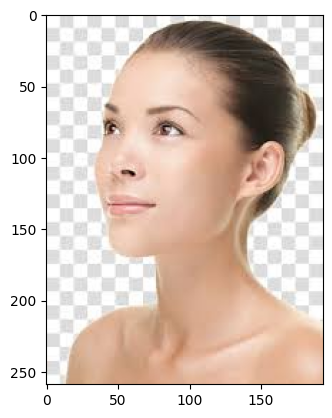

In [ ]:
#without mask

img = mpimg.imread("/content/data/without_mask/without_mask_2925.jpg")
imgplot = plt.imshow(img)
plt.show()

Image Processing

1.Resize the images
2.convert img to numpy arrays

In [ ]:
# convert images to np arrays

with_mask_path = "/content/data/with_mask/"
data = []
for img_file in with_mask_dir:
  image = Image.open(with_mask_path + img_file)
  image = image.resize((128,128))
  image = image.convert("RGB")
  image = np.array(image)
  data.append(image)

without_mask_path = "/content/data/without_mask/"

for img_file in without_mask_dir:
  image = Image.open(without_mask_path + img_file)
  image = image.resize((128,128))
  image = image.convert("RGB")
  image = np.array(image)
  data.append(image)

In [ ]:
print(data,len(data))

[array([[[ 84,  83,  83],
        [ 80,  81,  82],
        [ 72,  76,  80],
        ...,
        [ 51,  55,  56],
        [ 51,  55,  56],
        [ 52,  56,  57]],

       [[ 78,  78,  78],
        [ 78,  77,  78],
        [ 69,  71,  73],
        ...,
        [ 49,  53,  54],
        [ 50,  54,  55],
        [ 52,  56,  57]],

       [[ 69,  69,  70],
        [ 72,  72,  72],
        [ 68,  69,  69],
        ...,
        [ 45,  48,  49],
        [ 46,  50,  51],
        [ 49,  53,  54]],

       ...,

       [[163, 109,  26],
        [165, 109,  22],
        [176, 119,  24],
        ...,
        [ 81,  90,  97],
        [ 77,  86,  93],
        [ 83,  92,  99]],

       [[133,  77,  12],
        [135,  80,  12],
        [142,  87,  14],
        ...,
        [ 60,  69,  73],
        [ 64,  71,  75],
        [ 75,  81,  86]],

       [[188, 132,  49],
        [192, 137,  49],
        [182, 126,  37],
        ...,
        [ 39,  45,  48],
        [ 47,  51,  54],
        [ 61,  65,  68]

In [ ]:
type(data[0])

numpy.ndarray

In [ ]:
data[0].shape

(128, 128, 3)

In [ ]:
# Converting Image List and labels to numpy array
x=np.array(data)
y= np.array(labels)
print(x.shape,y.shape)

(7553, 128, 128, 3) (7553,)


**Train Test Split**

In [ ]:
x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=0.2,random_state=2)

In [ ]:
print(x_train.shape,y_train.shape,x_test.shape,y_test.shape)

(6042, 128, 128, 3) (6042,) (1511, 128, 128, 3) (1511,)


In [ ]:
# scaling the data
# normalisation or scaling
x_train_scaled = x_train/255
x_test_scaled = x_test/255

In [ ]:
x_train_scaled[0]  #o/p is btw 0 and 1

array([[[0.25490196, 0.36862745, 0.43137255],
        [0.25882353, 0.37254902, 0.43529412],
        [0.23529412, 0.34901961, 0.41176471],
        ...,
        [0.07058824, 0.14117647, 0.18431373],
        [0.0627451 , 0.13333333, 0.18039216],
        [0.05490196, 0.1254902 , 0.17254902]],

       [[0.27058824, 0.39607843, 0.45490196],
        [0.24705882, 0.37254902, 0.43137255],
        [0.22745098, 0.34901961, 0.40392157],
        ...,
        [0.06666667, 0.1372549 , 0.18431373],
        [0.0627451 , 0.13333333, 0.18039216],
        [0.05882353, 0.12941176, 0.17647059]],

       [[0.23137255, 0.36078431, 0.41176471],
        [0.23137255, 0.36470588, 0.41176471],
        [0.20784314, 0.3372549 , 0.38431373],
        ...,
        [0.0627451 , 0.13333333, 0.18039216],
        [0.0627451 , 0.13333333, 0.18039216],
        [0.05882353, 0.12941176, 0.17647059]],

       ...,

       [[0.98823529, 1.        , 1.        ],
        [0.98823529, 1.        , 1.        ],
        [0.98823529, 1

**Building Convolutional Neural Network**

In [ ]:
import tensorflow as tf
from tensorflow import keras
# keras needs either tensorflow or pytorch as its backend

In [ ]:
#setting up architecture over NN

model = keras.Sequential()

model.add(keras.layers.Conv2D(32,kernel_size=(3,3),activation="relu",input_shape=(128,128,3)))#convolution layer
#Conv2D layer and maxpooling layers are most important
model.add(keras.layers.MaxPooling2D(pool_size=(2,2)))
#filters = 32 is 1st parameter

model.add(keras.layers.Conv2D(64,kernel_size=(3,3),activation="relu"))#convolution layer
#input_shape is only at 1st layer
model.add(keras.layers.MaxPooling2D(pool_size=(2,2)))

model.add(keras.layers.Flatten()) #2D matrix is converted into vector,i.e,1D

model.add(keras.layers.Dense(128,activation="relu"))   #Dense -> every prev neuron connects to present neuron
model.add(keras.layers.Dropout(0.5)) #to avoid overfitting

num_classes=2
model.add(keras.layers.Dense(num_of_classes,activation="relu")) #
model.add(keras.layers.Dropout(0.5))

  # 2 => 1 for prob of image with mask another for without mask
model.add(keras.layers.Dense(num_classes,activation="sigmoid")) #sigmoid for binary


In [ ]:
# compiling the NN, i.e,setting optimization functions (Adam),loss functions
#for one-hot encoded labels => categorical_crossentropy
# for numerical encoded labels => sparse_categorical_crossentropy
model.compile(optimizer="adam",
              loss="sparse_categorical_crossentropy",
              metrics=["acc"])

In [ ]:
# Training the NN
history = model.fit(x_train_scaled,y_train,validation_split=0.1,epochs=10)
# validation_split = 10%,i.e,0.1 =>

Epoch 1/10
170/170 [==============================] - 4s 21ms/step - loss: 0.4716 - acc: 0.7887 - val_loss: 0.3144 - val_acc: 0.9256
Epoch 2/10
170/170 [==============================] - 3s 17ms/step - loss: 0.4663 - acc: 0.7857 - val_loss: 0.3205 - val_acc: 0.9107
Epoch 3/10
170/170 [==============================] - 3s 17ms/step - loss: 0.4535 - acc: 0.7971 - val_loss: 0.3026 - val_acc: 0.9207
Epoch 4/10
170/170 [==============================] - 3s 19ms/step - loss: 0.4468 - acc: 0.8025 - val_loss: 0.2942 - val_acc: 0.9273
Epoch 5/10
170/170 [==============================] - 4s 21ms/step - loss: 0.4399 - acc: 0.8043 - val_loss: 0.2775 - val_acc: 0.9289
Epoch 6/10
170/170 [==============================] - 3s 18ms/step - loss: 0.4380 - acc: 0.8012 - val_loss: 0.2859 - val_acc: 0.9240
Epoch 7/10
170/170 [==============================] - 3s 17ms/step - loss: 0.4199 - acc: 0.8146 - val_loss: 0.2701 - val_acc: 0.9421
Epoch 8/10
170/170 [==============================] - 3s 20ms/step - 

**Model Evaluation**

In [ ]:
# Evaluating

loss,accuracy = model.evaluate(x_test,y_test)
print("Loss:",loss,"\n","Accuracy:",accuracy)

48/48 [==============================] - 0s 6ms/step - loss: 24.6984 - acc: 0.9159
Loss: 24.69844627380371 
 Accuracy: 0.9159497022628784


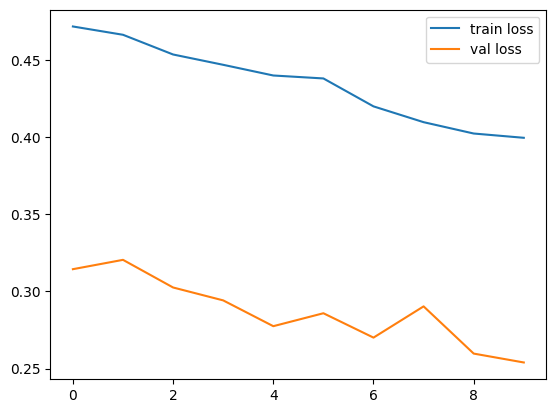

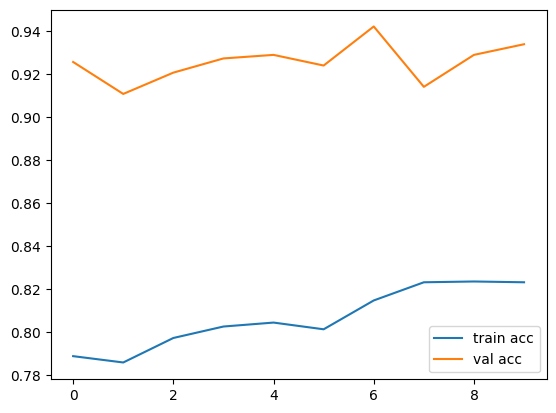

In [ ]:
h=history
#plot the loss value
plt.plot(h.history["loss"],label="train loss")  #for training loss plot
plt.plot(h.history["val_loss"],label="val loss") #for testing loss plot
plt.legend()
plt.show()

# plot the accuracy value
plt.plot(h.history["acc"],label="train acc")  #for training accuracy plot
plt.plot(h.history["val_acc"],label="val acc") #for testing accuracy plot
plt.legend()
plt.show()

**Predictive system**

Enter the path of the image to be predicted: /content/data/without_mask/without_mask_1000.jpg


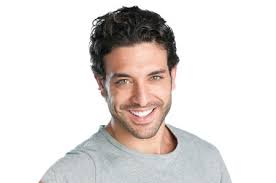

1/1 [==============================] - 0s 17ms/step
Raw prediction output: [[0.37053898 0.62946105]]
Predicted label: [[0 1]]
The person in the image is not wearing a mask


In [ ]:
input_image_path = input("Enter the path of the image to be predicted: ")
input_image = cv2.imread(input_image_path)
cv2_imshow(input_image)

# Preprocess the image
input_image_resize = cv2.resize(input_image, (128, 128))
input_image_scaled = input_image_resize / 255.0
input_image_reshaped = np.reshape(input_image_scaled, [1, 128, 128, 3])

# Predict
input_prediction = model.predict(input_image_reshaped)
print(f"Raw prediction output: {input_prediction}")

# Convert prediction to label
input_prediction_label = (input_prediction > 0.5).astype(int)
print(f"Predicted label: {input_prediction_label}")

predicted_class = input_prediction_label[0][0]  # Access the first element of the array

if predicted_class == 0:
    print("The person in the image is not wearing a mask")
else:
    print("The person in the image is wearing a mask")